# Assignment 3

## Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import librosa
import time

## Q1

### 1.1

In [81]:
def dft1(x):
    N = len(x) # Number of frequencies

    # Create the DFT matrix
    n = np.arange(N)
    k = n.reshape((N, 1))
    exp_matrix = np.exp(-2j * np.pi * k * n / N)

    return np.dot(exp_matrix, x)

# Shifts origin to the center of the matrix
def shift_center(x):
    n_rows, n_cols = x.shape
    rows_mid = n_rows // 2
    cols_mid = n_cols // 2
    shifted_x = np.zeros_like(x)

    shifted_x[rows_mid:, cols_mid:] = x[:rows_mid, :cols_mid]
    shifted_x[rows_mid:, :cols_mid] = x[:rows_mid, cols_mid:]
    shifted_x[:rows_mid, cols_mid:] = x[rows_mid:, :cols_mid]
    shifted_x[:rows_mid, :cols_mid] = x[rows_mid:, cols_mid:]

    return shifted_x

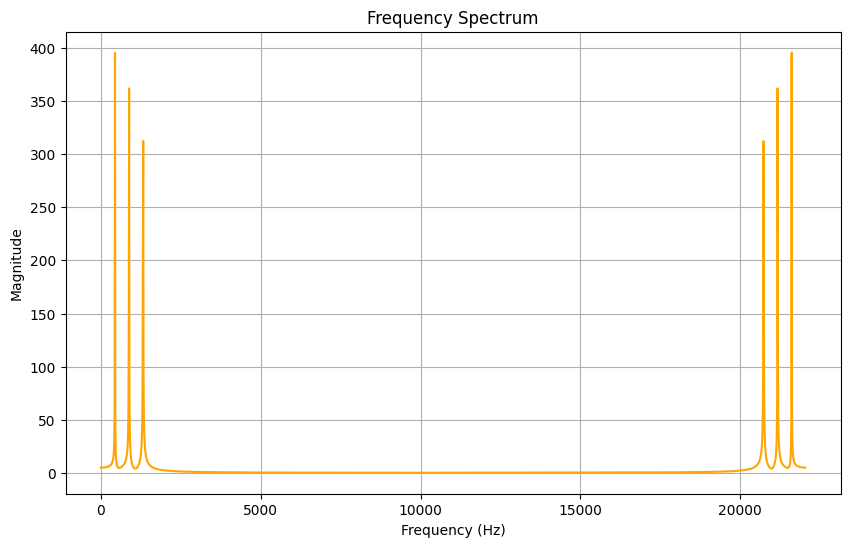

In [82]:
y, sample_rate = librosa.load("../data/1.wav")

# Taking only initial 2048 samples
n_samples = 2048
y = y[:n_samples]

# Taking dft
y_dft = dft1(y)

# Calculating the actual frequency value for each DFT component
frequencies = np.arange(n_samples) * sample_rate / n_samples
magnitudes = np.abs(y_dft)

# Plotting the Frequency Spectrum
plt.figure(figsize=(10, 6))
plt.plot(frequencies, magnitudes, c="orange")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Frequency Spectrum')
plt.grid(visible=True)
plt.show()

### 1.2

In [83]:
def dft2(x):
    # Apply dft1 to each row and column separately
    # To rows
    rows_applied_matrix = np.array([dft1(row) for row in x])

    # Transposing the 2D array
    x = rows_applied_matrix.T

    # To columns
    cols_applied_matrix = np.array([dft1(col) for col in x])

    return cols_applied_matrix.T

### 1.3

In [84]:
def fft1(x):
    x = np.complex128(x)
    N = len(x)

    # Padding to make power of 2
    target_length = 2 ** int(np.ceil(np.log2(N)))
    if N < target_length:
        x = np.pad(x, (0, target_length - N), 'constant')
    N = len(x)

    # Base case
    if N <= 1:
        return x

    # Divide
    fft_even = fft1(x[0::2])
    fft_odd = fft1(x[1::2])

    # Twiddle factor calc
    k = np.arange(N // 2)
    twiddle_factors = np.exp(-2j * np.pi * k / N)

    # Conquer
    fft_combined = np.empty(N, dtype=np.complex128)
    fft_combined[:N // 2] = fft_even + twiddle_factors * fft_odd
    fft_combined[N // 2:] = fft_even - twiddle_factors * fft_odd

    return fft_combined

### 1.4

In [85]:
def fft2(x):
    # Apply fft1 to each row and column separately
    # To rows
    rows_applied_matrix = np.array([fft1(row) for row in x])

    # Transposing the 2D array
    x = rows_applied_matrix.T

    # To columns
    cols_applied_matrix = np.array([fft1(col) for col in x])

    return cols_applied_matrix.T

### 1.5

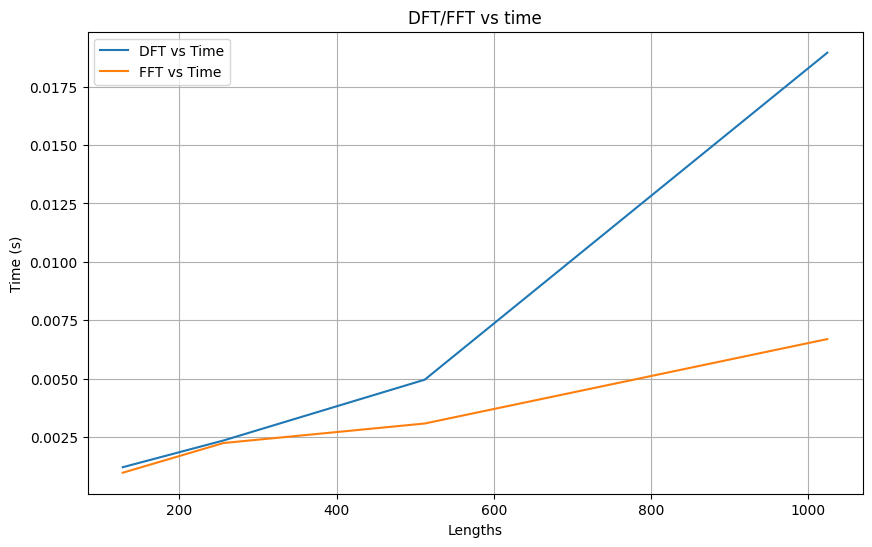

In [86]:
# Plotting time vs array size graph
lengths = [128, 256, 512, 1024]
dft_times = []
fft_times = []

for length in lengths:
    x = np.random.rand(length)

    start_time = time.time()
    fft1(x)
    end_time = time.time()
    fft_times.append(end_time - start_time)

    start_time = time.time()
    dft1(x)
    end_time = time.time()
    dft_times.append(end_time - start_time)

plt.figure(figsize=(10, 6))
plt.plot(lengths, dft_times, label='DFT vs Time')
plt.plot(lengths, fft_times, label='FFT vs Time')
plt.xlabel('Lengths')
plt.ylabel('Time (s)')
plt.title('DFT/FFT vs time')
plt.legend()
plt.grid(True)
plt.show()

> We can see that the time taken by DFT increases exponentially with increase in the size of the array whereas there is a steady increase in the time taken by FFT, for smaller arrays both take comparable time but for larger arrays FFT is much faster than DFT and hence FFT is much more scalable than DFT.

### 1.6

In [87]:
# Creating 128x128 image with values equally spaced in the domain of the sin and cos functions
x_axis = np.linspace(-np.pi, np.pi, 128)
y_axis = np.linspace(-np.pi, np.pi, 128)
X, Y = np.meshgrid(x_axis, y_axis)

signal1 = 0.5 * (1 + np.sin(X))
signal2 = 0.5 * (1 + np.sin(X) * np.sin(Y))
signal3 = 0.5 * (1 + np.sin(X**2 + Y**2))

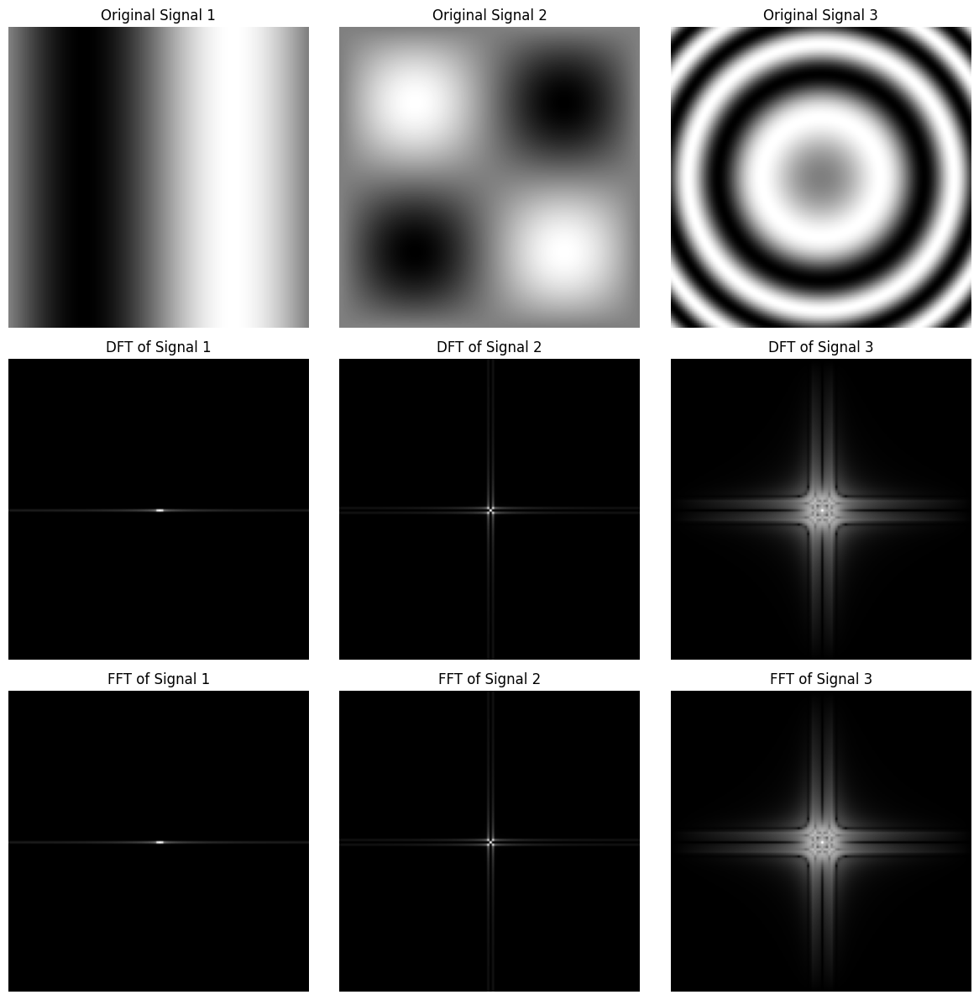

In [88]:
signals = [signal1, signal2, signal3]
fig, axes = plt.subplots(3, 3, figsize=(12, 12))

for col, signal in enumerate(signals):
    image = signal
    axes[0, col].imshow(image, cmap='gray')
    axes[0, col].set_title(f"Original Signal {col + 1}")
    axes[0, col].axis('off')

    dft_image = np.log1p(shift_center(np.abs(dft2(image))))
    axes[1, col].imshow(dft_image, cmap='gray')
    axes[1, col].set_title(f"DFT of Signal {col + 1}")
    axes[1, col].axis('off')

    fft_image = np.log1p(shift_center(np.abs(fft2(image))))
    axes[2, col].imshow(fft_image, cmap='gray')
    axes[2, col].set_title(f"FFT of Signal {col + 1}")
    axes[2, col].axis('off')

plt.tight_layout()
plt.show()

### 1.7

In [108]:
img1 = cv2.imread("../data/img1.jpg", cv2.IMREAD_GRAYSCALE)

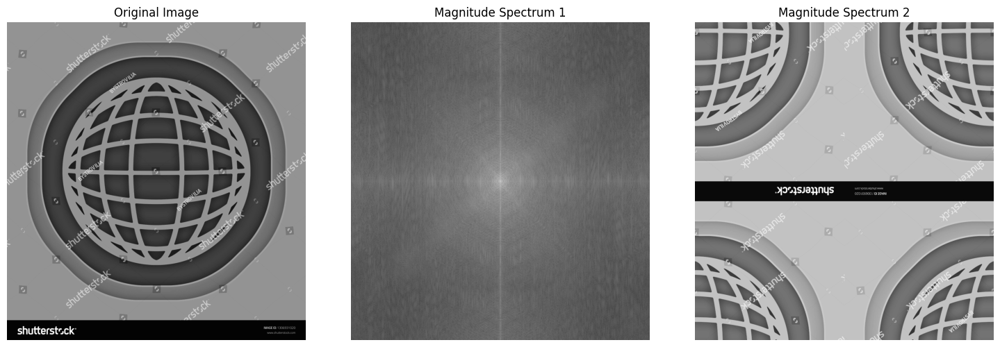

In [109]:
img_spectrum = dft2(img1)
magnitude_spectrum_2 = dft2(img_spectrum)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img1, cmap='gray')
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(np.log1p(shift_center(np.abs(img_spectrum))), cmap='gray')
axes[1].set_title("Magnitude Spectrum 1")
axes[1].axis('off')

axes[2].imshow(np.log1p(shift_center(np.abs(magnitude_spectrum_2))), cmap='gray')
axes[2].set_title("Magnitude Spectrum 2")
axes[2].axis('off')

plt.tight_layout()
plt.show()

> Here we can see that in the original image there is some grid pattern which is evident in the fourier transform of the image there are straing lines in horizontal and vertical dimensions and at 45 degree angles, also the image is symmetric hence the fourier transform also shows symmetry.

> The DFT of DFT of the image gives us the original image back but shifted in spatial dimension, since we know that in IDFT the power of e is +ve but in DFT it is -ve hence it's just a phase shift of 180 degrees hence we can see that the image has been spatially shifted by half the length and width in either direction.

## Question 2

## 2.1

In [ ]:
def ifft1(spectrum):
    spectrum = np.complex128(spectrum)
    N = len(spectrum)

    # Padding to make power of 2
    target_length = 2 ** int(np.ceil(np.log2(N)))
    if N < target_length:
        spectrum = np.pad(spectrum, (0, target_length - N), 'constant')
    N = len(spectrum)

    # Base case
    if N <= 1:
        return spectrum

    # Divide
    ifft_even = ifft1(spectrum[0::2])
    ifft_odd = ifft1(spectrum[1::2])

    # Twiddle factor calc for inverse FFT (note the positive sign)
    k = np.arange(N // 2)
    twiddle_factors = np.exp(2j * np.pi * k / N)

    # Conquer
    ifft_combined = np.empty(N, dtype=np.complex128)
    ifft_combined[:N // 2] = ifft_even + twiddle_factors * ifft_odd
    ifft_combined[N // 2:] = ifft_even - twiddle_factors * ifft_odd

    # Scale the output by 1/N for inverse FFT
    return ifft_combined * (1 / N)

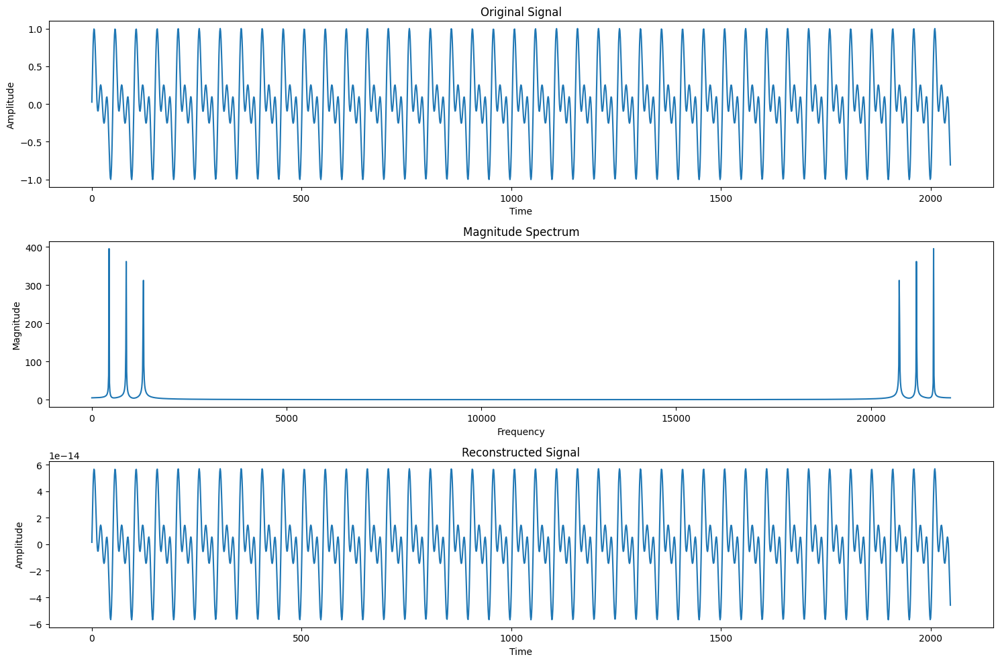

In [103]:
fig, axes = plt.subplots(3, 1, figsize=(15, 10))

axes[0].plot(y)
axes[0].set_title("Original Signal")
axes[0].set_xlabel("Time")
axes[0].set_ylabel("Amplitude")

axes[1].plot(frequencies, magnitudes)
axes[1].set_title("Magnitude Spectrum")
axes[1].set_xlabel("Frequency")
axes[1].set_ylabel("Magnitude")

reconstructed_signal = ifft1(y_dft).real
# reconstructed_signal = reconstructed_signal / np.max(reconstructed_signal) # Normalising the final output
axes[2].plot(reconstructed_signal)
axes[2].set_title("Reconstructed Signal")
axes[2].set_xlabel("Time")
axes[2].set_ylabel("Amplitude")

plt.tight_layout()
plt.show()

## 2.2

In [110]:
def ifft2(x):
    # Ensure the input is a 2D array of complex numbers
    x = np.array(x, dtype=np.complex128)

    # Apply ifft1 to each row
    rows_applied_matrix = np.array([ifft1(row) for row in x])

    # Transpose the result to apply ifft1 to the columns
    x = rows_applied_matrix.T

    # Apply ifft1 to each column
    cols_applied_matrix = np.array([ifft1(col) for col in x])

    # Transpose back to the original orientation
    return cols_applied_matrix.T

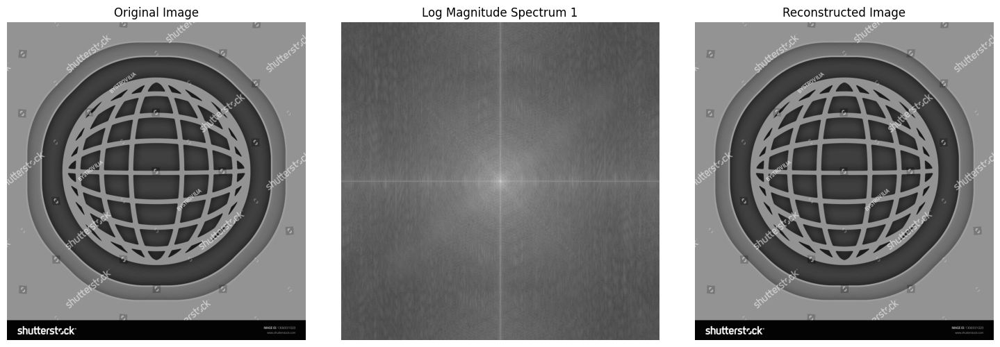

In [112]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

img_spectrum_fft = fft2(img1)

axes[0].imshow(img1, cmap='gray')
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(np.log1p(shift_center(np.abs(img_spectrum_fft))), cmap='gray')
axes[1].set_title("Log Magnitude Spectrum 1")
axes[1].axis('off')

reconstructed_image = ifft2(img_spectrum_fft).real
axes[2].imshow(reconstructed_image[:img1.shape[0], :img1.shape[1]], cmap="gray")
axes[2].set_title("Reconstructed Image")
axes[2].axis('off')

plt.tight_layout()
plt.show()

## 2.3

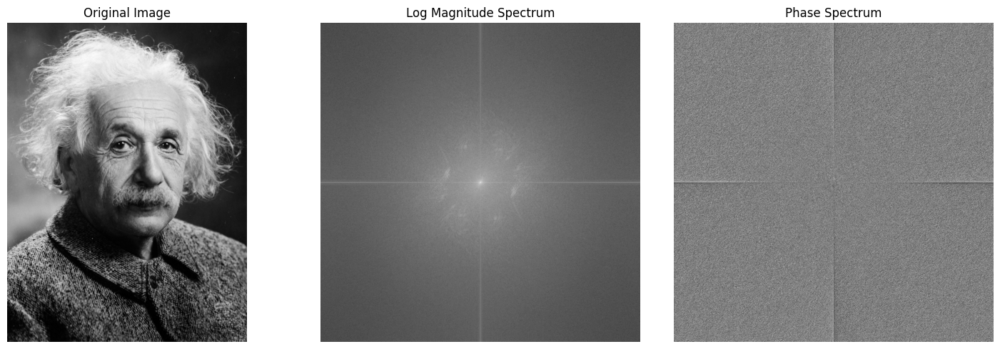

In [135]:
ein_img = cv2.imread("../data/ein.jpeg", cv2.IMREAD_GRAYSCALE)

ein_spectrum = fft2(ein_img)
ein_magnitude_spectrum = np.abs(ein_spectrum)
ein_phase_spectrum = np.angle(ein_spectrum)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(ein_img, cmap='gray')
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(np.log1p(np.abs(shift_center(ein_magnitude_spectrum))), cmap='gray')
axes[1].set_title("Log Magnitude Spectrum")
axes[1].axis('off')

axes[2].imshow(shift_center(ein_phase_spectrum), cmap='gray')
axes[2].set_title("Phase Spectrum")
axes[2].axis('off')

plt.tight_layout()
plt.show()

## 2.4

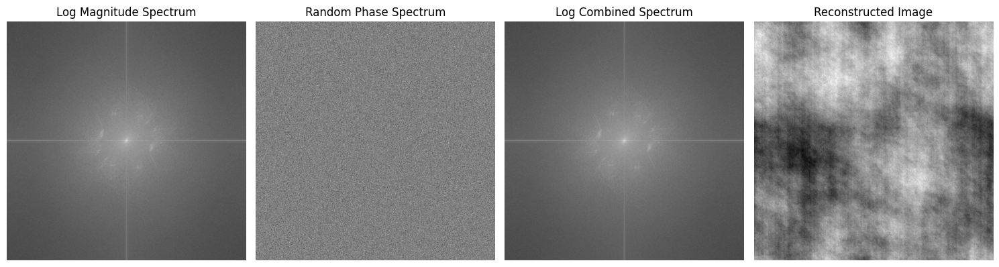

In [136]:
ein_random_phase_spectrum = np.random.uniform(-np.pi, np.pi, ein_phase_spectrum.shape)
ein_combined_spectrum = ein_magnitude_spectrum * np.exp(1j * ein_random_phase_spectrum)
ein_reconstructed_img = ifft2(ein_combined_spectrum).real

fig, axes = plt.subplots(1, 4, figsize=(15, 5))

axes[0].imshow(np.log1p(shift_center(ein_magnitude_spectrum)), cmap='gray')
axes[0].set_title("Log Magnitude Spectrum")
axes[0].axis('off')

axes[1].imshow(ein_random_phase_spectrum, cmap='gray')
axes[1].set_title("Random Phase Spectrum")
axes[1].axis('off')

axes[2].imshow(np.log1p(np.abs(shift_center(ein_combined_spectrum))), cmap='gray')
axes[2].set_title("Log Combined Spectrum")
axes[2].axis('off')

axes[3].imshow(ein_reconstructed_img, cmap='gray')
axes[3].set_title("Reconstructed Image")
axes[3].axis('off')

plt.tight_layout()
plt.show()

## 2.5

For original image:


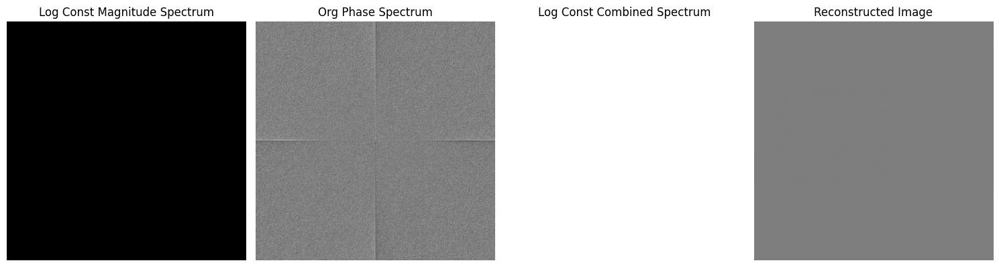

For resized image:


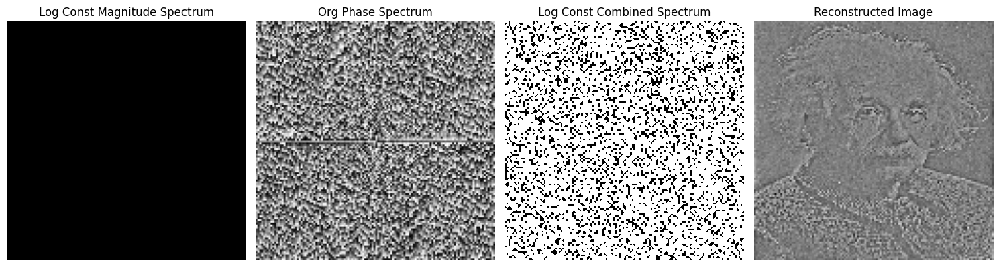

In [137]:
ein_mean_magnitude = np.mean(ein_magnitude_spectrum)
ein_const_magnitude_spectrum = np.ones_like(ein_magnitude_spectrum) * ein_mean_magnitude
ein_const_mag_combined_spectrum = ein_const_magnitude_spectrum * np.exp(1j * ein_phase_spectrum)
ein_const_reconstructed_img = ifft2(ein_const_mag_combined_spectrum).real
print("For original image:")
fig, axes = plt.subplots(1, 4, figsize=(15, 5))

axes[0].imshow(np.log1p(ein_const_magnitude_spectrum), cmap='gray')
axes[0].set_title("Log Const Magnitude Spectrum")
axes[0].axis('off')

axes[1].imshow(shift_center(ein_phase_spectrum), cmap='gray')
axes[1].set_title("Org Phase Spectrum")
axes[1].axis('off')

axes[2].imshow(np.log1p(np.abs(shift_center(ein_const_mag_combined_spectrum))), cmap='gray')
axes[2].set_title("Log Const Combined Spectrum")
axes[2].axis('off')

axes[3].imshow(ein_const_reconstructed_img, cmap='gray')
axes[3].set_title("Reconstructed Image")
axes[3].axis('off')

plt.tight_layout()
plt.show()

ein_img_resized = cv2.resize(ein_img, (128, 128))
ein_spectrum = fft2(ein_img_resized)
ein_magnitude_spectrum = np.abs(ein_spectrum)
ein_phase_spectrum = np.angle(ein_spectrum)
ein_mean_magnitude = np.mean(ein_magnitude_spectrum)
ein_const_magnitude_spectrum = np.ones_like(ein_magnitude_spectrum) * ein_mean_magnitude
ein_const_mag_combined_spectrum = ein_const_magnitude_spectrum * np.exp(1j * ein_phase_spectrum)
ein_const_reconstructed_img = ifft2(ein_const_mag_combined_spectrum).real

print("For resized image:")
fig, axes = plt.subplots(1, 4, figsize=(15, 5))

axes[0].imshow(np.log1p(ein_const_magnitude_spectrum), cmap='gray')
axes[0].set_title("Log Const Magnitude Spectrum")
axes[0].axis('off')

axes[1].imshow(shift_center(ein_phase_spectrum), cmap='gray')
axes[1].set_title("Org Phase Spectrum")
axes[1].axis('off')

axes[2].imshow(np.log1p(np.abs(shift_center(ein_const_mag_combined_spectrum))), cmap='gray')
axes[2].set_title("Log Const Combined Spectrum")
axes[2].axis('off')

axes[3].imshow(ein_const_reconstructed_img, cmap='gray')
axes[3].set_title("Reconstructed Image")
axes[3].axis('off')

plt.tight_layout()
plt.show()

## Question 3

## 3.1

In [61]:
def bandpass_filter(arr, lower_radius, higher_radius):
    center = np.array(arr.shape) // 2
    x, y = np.meshgrid(np.arange(arr.shape[0]), np.arange(arr.shape[1]), indexing='ij')
    distances = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    mask = (distances >= lower_radius) & (distances <= higher_radius)
    filtered_arr = np.where(mask, arr, 0)
    return filtered_arr

def linepass_filter(arr, linewidth):
    center = np.array(arr.shape) // 2
    y, x = np.indices(arr.shape)
    dist_y = np.abs(center[0] - y)
    dist_x = np.abs(center[1] - x)
    min_dist = np.minimum(dist_x, dist_y)
    filtered_arr = np.where(min_dist <= linewidth // 2, arr, 0)
    return filtered_arr

def gaussian_highpass_filter(arr, sigma):
    center = np.array(arr.shape) // 2
    y, x = np.indices(arr.shape)
    dist_sq = (x - center[1])**2 + (y - center[0])**2
    gaussian_filter = np.exp(-dist_sq / (2 * sigma**2))
    highpass_filter = 1 - gaussian_filter
    filtered_arr = arr * highpass_filter
    return filtered_arr

def highpass_filter(arr, radius):
    center = np.array(arr.shape) // 2
    x, y = np.meshgrid(np.arange(arr.shape[0]), np.arange(arr.shape[1]), indexing='ij')
    distances = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    mask = distances >= radius
    filtered_arr = np.where(mask, arr, 0)
    return filtered_arr

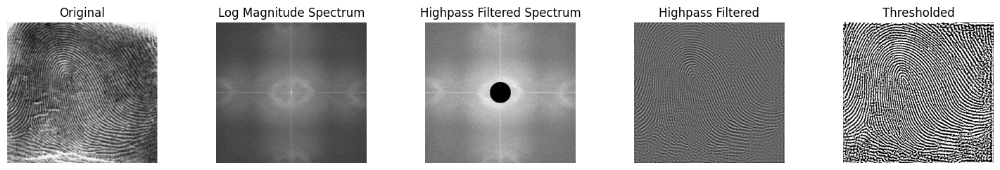

In [78]:
fig, axes = plt.subplots(1, 5, figsize=(15, 2.5))

fingerprint_img = cv2.imread("../data/fingerprint.png", cv2.IMREAD_GRAYSCALE)
axes[0].imshow(fingerprint_img.astype(np.uint8), cmap='gray')
axes[0].axis('off')
axes[0].set_title("Original")

fingerprint_spectrum = np.fft.fft2(fingerprint_img)
fingerprint_spectrum_shifted = np.fft.fftshift(fingerprint_spectrum)

axes[1].imshow(np.log1p(np.abs(fingerprint_spectrum_shifted)), cmap='gray')
axes[1].axis('off')
axes[1].set_title("Log Magnitude Spectrum")

fingerprint_highpass_spectrum = highpass_filter(fingerprint_spectrum_shifted, 40)

axes[2].imshow(np.log1p(np.abs(fingerprint_highpass_spectrum)), cmap='gray')
axes[2].axis('off')
axes[2].set_title("Highpass Filtered Spectrum")

fingerprint_highpass_spectrum_ifftshifted = np.fft.ifftshift(fingerprint_highpass_spectrum)
fingerprint_highpass_img = np.fft.ifft2(fingerprint_highpass_spectrum_ifftshifted).real

axes[3].imshow(fingerprint_highpass_img, cmap='gray')
axes[3].axis('off')
axes[3].set_title("Highpass Filtered")

fingerprint_highpass_img = fingerprint_highpass_img.astype(np.uint8)
thresholded_img = cv2.threshold(fingerprint_highpass_img, 140, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
axes[4].imshow(thresholded_img, cmap='gray')
axes[4].axis('off')
axes[4].set_title("Thresholded")

plt.tight_layout()
plt.show()

## Question 4

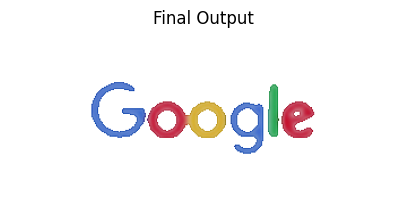

In [ ]:
google_image = cv2.imread("../data/google.jpeg", cv2.IMREAD_COLOR)
google_image = cv2.cvtColor(google_image, cv2.COLOR_BGR2RGB)

gaussian_blur = cv2.GaussianBlur(google_image, (13, 13), 0)

bright_mask = np.all(gaussian_blur > 150, axis=2)
enhanced = gaussian_blur.copy()
enhanced[bright_mask] = 255
enhanced[~bright_mask] -= 30
brightened = enhanced.astype(np.uint8)

blurred = cv2.GaussianBlur(brightened, (3, 3), 1)
sharp = cv2.addWeighted(brightened, 3, blurred, -2, 0)
enhanced = np.clip(sharp, 0, 255).astype(np.uint8)

# Display only the final output
plt.figure(figsize=(5, 5))
plt.imshow(enhanced)
plt.title('Final Output')
plt.axis('off')
plt.show()

## Question 5

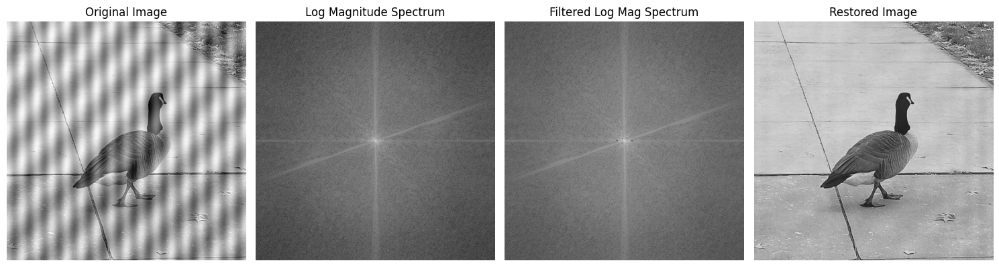

In [ ]:
bird_img = cv2.imread('../data/bird.png', cv2.IMREAD_GRAYSCALE)

# Apply FFT and shift
fft_result = np.fft.fft2(bird_img)
fft_shifted = np.fft.fftshift(fft_result)

# Define notch filter points
notch_points = [(0, 17), (0, -17),(0, 15), (0, -15), (0, 16), (0, -16), (-5, -5), (5, 5), (-5, 5), (5, -5)]
mask = np.ones(bird_img.shape)
cy, cx = bird_img.shape[0] // 2, bird_img.shape[1] // 2

# Directly zero-out the specified points in the frequency domain
for point in notch_points:
    py, px = point[0] + cy, point[1] + cx
    mask[py, px] = 0  # Set the point to zero

    # Also zero-out the symmetric point
    py_sym, px_sym = -point[0] + cy, -point[1] + cx
    mask[py_sym, px_sym] = 0  # Set the symmetric point to zero

# Apply notch filter
filtered_spectrum = fft_shifted * mask

# Inverse shift and inverse FFT
ifft_shifted = np.fft.ifftshift(filtered_spectrum)
restored_image = np.real(np.fft.ifft2(ifft_shifted))

# Plotting results
fig, axes = plt.subplots(1, 4, figsize=(15, 10))

axes[0].imshow(bird_img, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

spectrum = np.log1p(np.abs(fft_shifted))
axes[1].imshow(spectrum, cmap='gray')
axes[1].set_title('Log Magnitude Spectrum')
axes[1].axis('off')

filtered_spectrum_display = np.log1p(np.abs(filtered_spectrum))
axes[2].imshow(filtered_spectrum_display, cmap='gray')
axes[2].set_title('Filtered Log Mag Spectrum')
axes[2].axis('off')

axes[3].imshow(restored_image, cmap='gray')
axes[3].set_title('Restored Image')
axes[3].axis('off')

plt.tight_layout()
plt.show()

> We can clearly see that there is some sort of periodic noise in the image, so I took the fourier transform of the image and it was clearly visible in the form of 6 dots places which were out of place and were leading to noise, so I manually calculated (by hit and trial) the correct place of the spots and applied a pixel wide notch reject filter there and again converted the image into spatial domain to get the final filtered output.

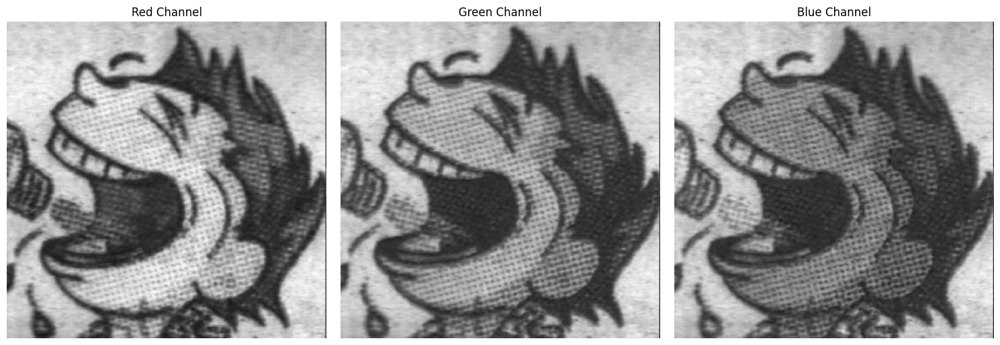

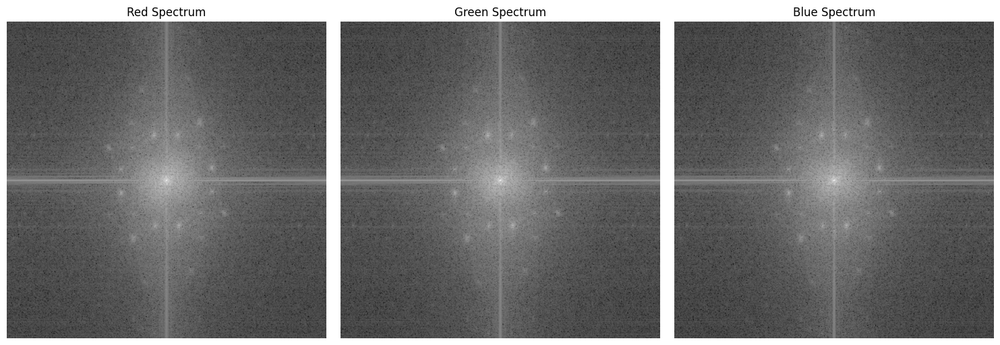

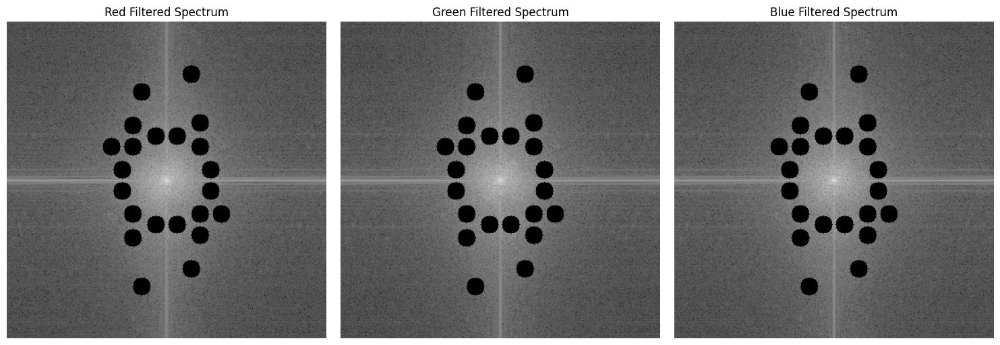

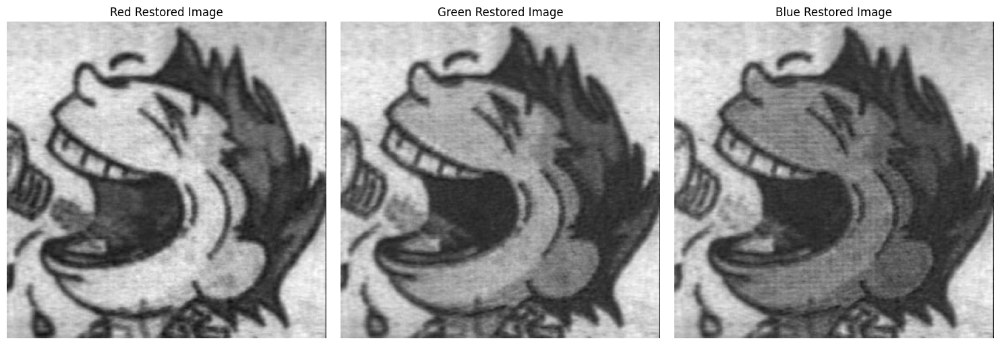

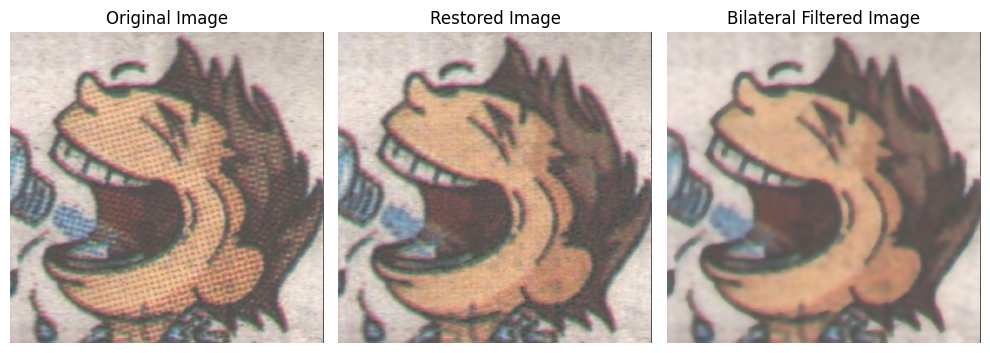

In [ ]:
cart_img = cv2.imread("../data/cart.jpg", cv2.IMREAD_COLOR)
cart_img = cv2.cvtColor(cart_img, cv2.COLOR_BGR2RGB)

r, g, b = cv2.split(cart_img)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(r, cmap='gray')
axes[0].set_title('Red Channel')
axes[0].axis('off')

axes[1].imshow(g, cmap='gray')
axes[1].set_title('Green Channel')
axes[1].axis('off')

axes[2].imshow(b, cmap='gray')
axes[2].set_title('Blue Channel')
axes[2].axis('off')

plt.tight_layout()
plt.show()

r_fft = np.fft.fft2(r)
g_fft = np.fft.fft2(g)
b_fft = np.fft.fft2(b)

r_shifted = np.fft.fftshift(r_fft)
g_shifted = np.fft.fftshift(g_fft)
b_shifted = np.fft.fftshift(b_fft)

r_spectrum = np.log1p(np.abs(r_shifted))
g_spectrum = np.log1p(np.abs(g_shifted))
b_spectrum = np.log1p(np.abs(b_shifted))

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(r_spectrum, cmap='gray')
axes[0].set_title('Red Spectrum')
axes[0].axis('off')

axes[1].imshow(g_spectrum, cmap='gray')
axes[1].set_title('Green Spectrum')
axes[1].axis('off')

axes[2].imshow(b_spectrum, cmap='gray')
axes[2].set_title('Blue Spectrum')
axes[2].axis('off')

plt.tight_layout()
plt.show()

notch_points = [(50, 12), (50, -12), (12, 50), (-12, 50), (62, 38), (-65, 38), (-62, -38), (38, 38), (38, -38), (-120, 28), (100, 28), (38, 62), (-50, -12), (-50, 12), (-12, -50), (12, -50), (-62, -38), (65, -38), (62, 38), (-38, -38), (-38, 38), (120, -28), (-100, -28), (-38, -62)]

def apply_notch_filter(fourier_transform, notch_points, radius):
    filtered_transform = fourier_transform.copy()
    rows, cols = filtered_transform.shape
    center_x, center_y = rows // 2, cols // 2

    for dx, dy in notch_points:
        x_center = center_x + dx
        y_center = center_y + dy

        for x in range(rows):
            for y in range(cols):
                distance = np.sqrt((x - x_center) ** 2 + (y - y_center) ** 2)
                if distance <= radius:
                    filtered_transform[x, y] = 0

    return filtered_transform

radius = 10

r_filtered = apply_notch_filter(r_shifted, notch_points, radius)
g_filtered = apply_notch_filter(g_shifted, notch_points, radius)
b_filtered = apply_notch_filter(b_shifted, notch_points, radius)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(np.log1p(np.abs(r_filtered)), cmap='gray')
axes[0].set_title('Red Filtered Spectrum')
axes[0].axis('off')

axes[1].imshow(np.log1p(np.abs(g_filtered)), cmap='gray')
axes[1].set_title('Green Filtered Spectrum')
axes[1].axis('off')

axes[2].imshow(np.log1p(np.abs(b_filtered)), cmap='gray')
axes[2].set_title('Blue Filtered Spectrum')
axes[2].axis('off')

plt.tight_layout()
plt.show()

r_restored = np.real(np.fft.ifft2(np.fft.ifftshift(r_filtered)))
g_restored = np.real(np.fft.ifft2(np.fft.ifftshift(g_filtered)))
b_restored = np.real(np.fft.ifft2(np.fft.ifftshift(b_filtered)))

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

r_restored = np.clip(r_restored, 0, 255).astype(np.uint8)
g_restored = np.clip(g_restored, 0, 255).astype(np.uint8)
b_restored = np.clip(b_restored, 0, 255).astype(np.uint8)

axes[0].imshow(r_restored, cmap='gray')
axes[0].set_title('Red Restored Image')
axes[0].axis('off')

axes[1].imshow(g_restored, cmap='gray')
axes[1].set_title('Green Restored Image')
axes[1].axis('off')

axes[2].imshow(b_restored, cmap='gray')
axes[2].set_title('Blue Restored Image')
axes[2].axis('off')

plt.tight_layout()
plt.show()

restored_img = cv2.merge([r_restored, g_restored, b_restored])
bilateral_filtered_img = cv2.bilateralFilter(restored_img, d=9, sigmaColor=75, sigmaSpace=75)

fig, axes = plt.subplots(1, 3, figsize=(10, 5))

axes[0].imshow(cart_img)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(restored_img)
axes[1].set_title('Restored Image')
axes[1].axis('off')

axes[2].imshow(bilateral_filtered_img)      
axes[2].set_title('Bilateral Filtered Image')
axes[2].axis('off')

plt.tight_layout()
plt.show()

> Process to Filter Moiré Patterns from an Image, we can see that there is some periodic noise in the image, since this is a colored image I first separated out each color channel and analysed it separately, the placement of noise was same in each color channel. So converted each channel into the frequency domain there we could clearly see 22 distinguishable noise frequency dots in the frequency domain, so I figured out their position manually (by hit and trial, they were symmetric so I only needed to find half of them) and then applied notch reject filter with radius 10 at those points and again combined the three channels to obtain the colored image but still there were some artifacts present in the image and it was still not that smooth, so I applied bilateral filter to smoothen out the image and keep the edges sharp.


## Question 6

Number of coins: 5


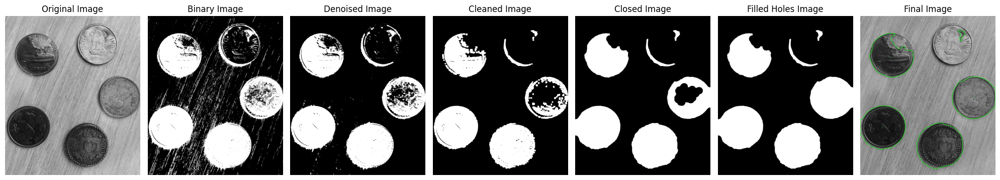

In [ ]:
coin_detection_img = cv2.imread('../data/coin-detection.jpg')
coin_detection_img_bw = cv2.cvtColor(coin_detection_img, cv2.COLOR_BGR2GRAY)

_, coin_detection_bin_img = cv2.threshold(coin_detection_img_bw, 128, 255, cv2.THRESH_BINARY_INV)

# Define SE
diagonal_kernel = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 1]], dtype=np.uint8)
small_kernel = np.ones((5, 5), dtype=np.uint8)
large_ellipse_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (25, 25))

# Apply Morphological operations
coin_detection_denoised_img = cv2.morphologyEx(coin_detection_bin_img, cv2.MORPH_OPEN, diagonal_kernel, iterations=5)
coin_detection_cleaned_img = cv2.morphologyEx(coin_detection_denoised_img, cv2.MORPH_OPEN, small_kernel, iterations=5)
coin_detection_closed_img = cv2.morphologyEx(coin_detection_cleaned_img, cv2.MORPH_CLOSE, large_ellipse_kernel, iterations=5)

# Fill holes
coin_detection_padded_img = np.pad(coin_detection_closed_img, pad_width=1, mode='constant', constant_values=0)
cv2.floodFill(coin_detection_padded_img, None, (0, 0), 255)
coin_detection_filled_hole_img = coin_detection_closed_img | ~coin_detection_padded_img[1:-1, 1:-1]

# Find outlines based on area
contours, _ = cv2.findContours(coin_detection_filled_hole_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
final_img = coin_detection_img.copy()
valid_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > 700 and 
                  (4 * np.pi * cv2.contourArea(cnt) / (cv2.arcLength(cnt, True) ** 2) if cv2.arcLength(cnt, True) > 0 else 0) > 0.3]

# Write on image and draw outlines
for i, contour in enumerate(valid_contours):
    moments = cv2.moments(contour)
    if moments["m00"] != 0:
        center_x = int(moments["m10"] / moments["m00"])
        center_y = int(moments["m01"] / moments["m00"])
        cv2.putText(final_img, f"{i + 1}", (center_x - 10, center_y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.drawContours(final_img, [contour], -1, (0, 255, 0), 5)

print("Number of coins:", len(valid_contours))

images = [
    coin_detection_img_bw,
    coin_detection_bin_img,
    coin_detection_denoised_img,
    coin_detection_cleaned_img,
    coin_detection_closed_img,
    coin_detection_filled_hole_img,
    final_img
]
titles = [
    'Original Image',
    'Binary Image',
    'Denoised Image',
    'Cleaned Image',
    'Closed Image',
    'Filled Holes Image',
    'Final Image'
]

plt.figure(figsize=(20, 5))
for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(1, len(images), i + 1)
    if title != 'Final Image':
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(img)
    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

## Question 7

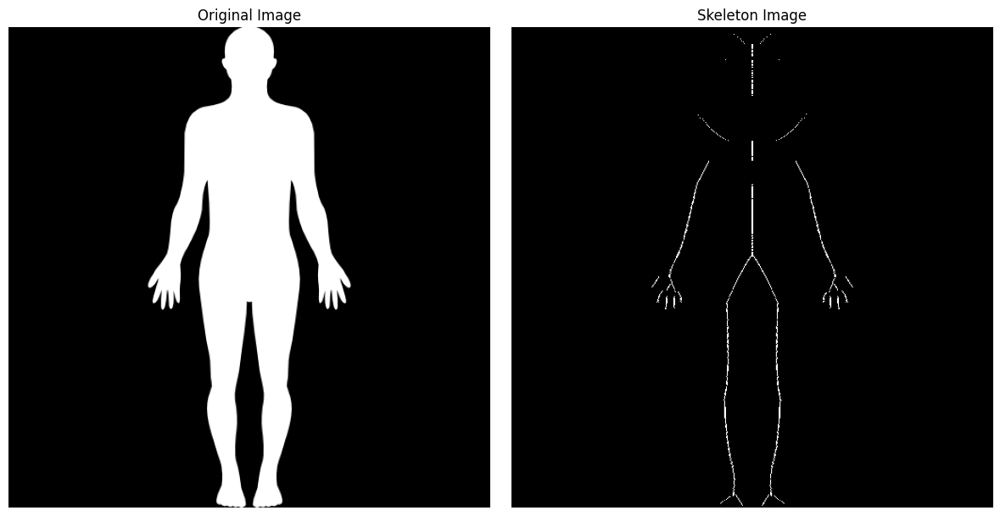

In [35]:
human_img = cv2.imread('../data/human.png', cv2.IMREAD_UNCHANGED)
human_img = human_img[:, :, 3]
skeleton_img = np.zeros(human_img.shape, np.uint8)

# Structuring element for morphological operations
se = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
bin_img = np.where(human_img > 0, 255, 0).astype(np.uint8)
eroded_image = bin_img.copy()

while True:
    eroded = cv2.erode(eroded_image, se)
    opened_eroded = cv2.morphologyEx(eroded, cv2.MORPH_OPEN, se)
    skeleton_part = eroded - opened_eroded
    skeleton_img = skeleton_img | skeleton_part
    eroded_image = eroded.copy()
    
    if cv2.countNonZero(eroded_image) == 0:
        break

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(human_img, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(skeleton_img, cmap='gray')
axes[1].set_title('Skeleton Image')
axes[1].axis('off')

plt.tight_layout()
plt.show()

## Question 8

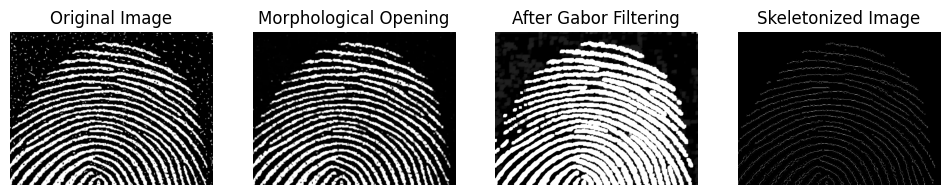

In [43]:
fingerprint_img2 = cv2.imread('../data/fingerprint2.png', cv2.IMREAD_GRAYSCALE)

rect_se_small = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
opened_img = cv2.morphologyEx(fingerprint_img2, cv2.MORPH_OPEN, rect_se_small)

gabor_kernel = cv2.getGaborKernel((11, 11), 4.0, np.pi / 4, 12.0, 0.5, 0, ktype=cv2.CV_32F)
gabor_filtered_img = cv2.filter2D(opened_img, cv2.CV_8UC3, gabor_kernel)

rect_se_large = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 13))
gabor_filtered_img = cv2.morphologyEx(gabor_filtered_img, cv2.MORPH_OPEN, rect_se_large)

bin_img = np.where(opened_img > 128, 1, 0).astype(np.uint8)

if len(bin_img.shape) == 3:
    bin_img = bin_img[:, :, 0]

cross_kernel_3x3 = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
skeleton_img = np.zeros(bin_img.shape, dtype=np.uint8)
eroded_img = bin_img.copy()

while True:
    eroded = cv2.erode(eroded_img, cross_kernel_3x3)
    opened_eroded = cv2.morphologyEx(eroded, cv2.MORPH_OPEN, cross_kernel_3x3)
    skeleton_part = eroded - opened_eroded
    skeleton_img = skeleton_img | skeleton_part
    eroded_img = eroded.copy()
    
    if cv2.countNonZero(eroded_img) == 0:
        break

# Display imgs
plt.figure(figsize=(12, 8))

plt.subplot(1, 4, 1)
plt.imshow(fingerprint_img2, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(opened_img, cmap='gray')
plt.title('Morphological Opening')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(gabor_filtered_img, cmap='gray')
plt.title('After Gabor Filtering')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(skeleton_img, cmap='gray')
plt.title('Skeletonized Image')
plt.axis('off')

plt.show()